In [94]:
!pip install facenet-pytorch

In [200]:
import os
import zipfile
import numpy as np
import pandas as pd
import matplotlib
import seaborn as sns
import torch
import matplotlib.pyplot as plt
# from tqdm import tqdm_notebook
%matplotlib inline 
# from google.colab.patches import cv2_imshow
from IPython.display import HTML 
from base64 import b64encode 
import cv2 as cv
from skimage.measure import compare_ssim
import glob
import time
from PIL import Image
from facenet_pytorch import MTCNN, InceptionResnetV1, extract_face
from tqdm import tqdm

import math
import pickle
from functools import partial
from collections import defaultdict

from PIL import Image
from glob import glob

import cv2
import skimage.measure
import albumentations as A
from tqdm.notebook import tqdm 
from albumentations.pytorch import ToTensor 

import torch
import torch.nn as nn
import torch.nn.functional as F
from torch.autograd import Variable
from torchvision.models.video import mc3_18, r2plus1d_18

from facenet_pytorch import MTCNN

In [96]:
DATA_FOLDER = "../input/deepfake-detection-challenge" 
TRAIN_SAMPLE_FOLDER = "train_sample_videos"
TEST_FOLDER = "test_videos"

In [97]:
FACE_DETECTION_FOLDER = '../input/haarcascades'
print(f"Face detection resources: {os.listdir(FACE_DETECTION_FOLDER)}")    

Face detection resources: ['haarcascade_upperbody.xml', 'haarcascade_eye.xml', 'haarcascade_licence_plate_rus_16stages.xml', 'haarcascade_frontalface_default.xml', 'haarcascade_frontalcatface_extended.xml', 'haarcascade_eye_tree_eyeglasses.xml', 'haarcascade_fullbody.xml', 'haarcascade_lowerbody.xml', 'haarcascade_righteye_2splits.xml', 'haarcascade_frontalface_alt_tree.xml', 'haarcascade_frontalcatface.xml', 'haarcascade_frontalface_alt.xml', 'haarcascade_russian_plate_number.xml', 'haarcascade_smile.xml', 'haarcascade_profileface.xml', 'haarcascade_frontalface_alt2.xml', 'haarcascade_lefteye_2splits.xml']


In [98]:
train_list = list(os.listdir(os.path.join(DATA_FOLDER, TRAIN_SAMPLE_FOLDER)))
ext_dict = []
for file in train_list:
    file_ext = file.split('.')[1]
    if (file_ext not in ext_dict):
        ext_dict.append(file_ext)
print(f"Extensions: {ext_dict}") 

Extensions: ['mp4', 'json']


In [99]:
test_list = list(os.listdir(os.path.join(DATA_FOLDER, TEST_FOLDER)))
ext_dict = []
for file in test_list:
    file_ext = file.split('.')[1]
    if (file_ext not in ext_dict):
        ext_dict.append(file_ext)
print(f"Extensions: {ext_dict}")

Extensions: ['mp4']


In [100]:
json_file = [file for file in train_list if  file.endswith('json')][0]
print(f"JSON file: {json_file}")
#reading the json file
def get_meta_from_json(path):
    df = pd.read_json(os.path.join(DATA_FOLDER, path, json_file))
    df = df.T
    return df

meta_train_df = get_meta_from_json(TRAIN_SAMPLE_FOLDER)
meta_train_df.head()

JSON file: metadata.json


,label,split,original
aagfhgtpmv.mp4,FAKE,train,vudstovrck.mp4
aapnvogymq.mp4,FAKE,train,jdubbvfswz.mp4
abarnvbtwb.mp4,REAL,train,None
abofeumbvv.mp4,FAKE,train,atvmxvwyns.mp4
abqwwspghj.mp4,FAKE,train,qzimuostzz.mp4


In [101]:
def missing_data(data):
    total = data.isnull().sum()
    percent = (data.isnull().sum()/data.isnull().count()*100)
    tt = pd.concat([total, percent], axis=1, keys=['Total', 'Percent'])
    types = []
    for col in data.columns:
        dtype = str(data[col].dtype)
        types.append(dtype)
    tt['Types'] = types
    return(np.transpose(tt))

In [102]:
missing_data(meta_train_df)

,label,split,original
Total,0,0,77
Percent,0,0,19.25
Types,object,object,object


In [103]:
missing_data(meta_train_df.loc[meta_train_df.label == 'REAL'])

,label,split,original
Total,0,0,77
Percent,0,0,100
Types,object,object,object


In [104]:
def unique_values(data):
    total = data.count()
    tt = pd.DataFrame(total)
    tt.columns = ['Totals']
    uniques = []
    for col in data.columns:
        unique = data[col].nunique() #collect all unique instances
        uniques.append(unique)
    tt['Uniques'] = uniques
    return(np.transpose(tt))

In [105]:
unique_values(meta_train_df)

,label,split,original
Totals,400,400,323
Uniques,2,1,209


In [106]:
def most_frequent_values(data):
    total = data.count()
    tt = pd.DataFrame(total)
    tt.columns = ['Total']
    items = []
    vals = []
    for col in data.columns:
        itm = data[col].value_counts().index[0]
        val = data[col].value_counts().values[0]
        items.append(itm)
        vals.append(val)
    tt['Most frequent item'] = items
    tt['Frequence'] = vals
    tt['Percent from total'] = np.round(vals / total * 100, 3)
    return(np.transpose(tt))

In [107]:
most_frequent_values(meta_train_df)

,label,split,original
Total,400,400,323
Most frequent item,FAKE,train,meawmsgiti.mp4
Frequence,323,400,6
Percent from total,80.75,100,1.858


In [108]:
most_frequent_values(meta_train_df.loc[meta_train_df.label == 'FAKE'])

,label,split,original
Total,323,323,323
Most frequent item,FAKE,train,meawmsgiti.mp4
Frequence,323,323,6
Percent from total,100,100,1.858


In [109]:
def plot_count(feature, title, df, size=1):
  '''
    Plot count of classes / feature
    param: feature - the feature to analyze
    param: title - title to add to the graph
    param: df - dataframe from which we plot feature's classes distribution 
    param: size - default 1.
  '''  
  f, ax = plt.subplots(1,1, figsize=(4*size,4))
  total = float(len(df))
  g =  sns.countplot(df[feature], order = df[feature].value_counts().index[:20], palette='Set3')
  g.set_title("Number and percentage of {}".format(title)) 
  if(size > 2):
    plt.xticks(rotation=90, size=8)
  for p in ax.patches:
     height = p.get_height()
     ax.text(p.get_x()+ p.get_width()/2.,height + 3,'{:1.2f}%'.format(100*height/total),ha="center")

  plt.show()

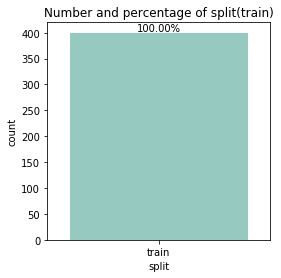

In [110]:
plot_count('split','split(train)',meta_train_df)

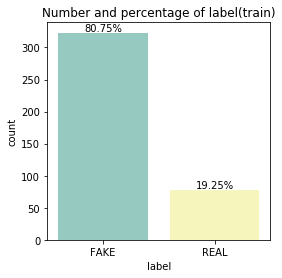

In [111]:
plot_count('label','label(train)',meta_train_df)

In [112]:
meta = np.array(list(meta_train_df.index))
storage = np.array([file for file in train_list if  file.endswith('mp4')])
print(f"Metadata: {meta.shape[0]}, Folder: {storage.shape[0]}")
print(f"Files in metadata and not in folder: {np.setdiff1d(meta,storage,assume_unique=False).shape[0]}")
print(f"Files in folder and not in metadata: {np.setdiff1d(storage,meta,assume_unique=False).shape[0]}")

Metadata: 400, Folder: 400
Files in metadata and not in folder: 0
Files in folder and not in metadata: 0


In [113]:
fake_train_sample_video = list(meta_train_df.loc[meta_train_df.label=='FAKE'].sample(3).index)
fake_train_sample_video


['agdkmztvby.mp4', 'doanjploai.mp4', 'bguwlyazau.mp4']

In [114]:
def display_image_from_video(video_path):
    '''
    input: video_path - path for video
    process:
    1. perform a video capture from the video
    2. read the image
    3. display the image
    '''
    capture_img = cv.VideoCapture(video_path)
    ret, frame = capture_img.read()
    fig = plt.figure(figsize=(10,10))
    ax = fig.add_subplot(111)
    frame = cv.cvtColor(frame, cv.COLOR_BGR2RGB)
    ax.imshow(frame)

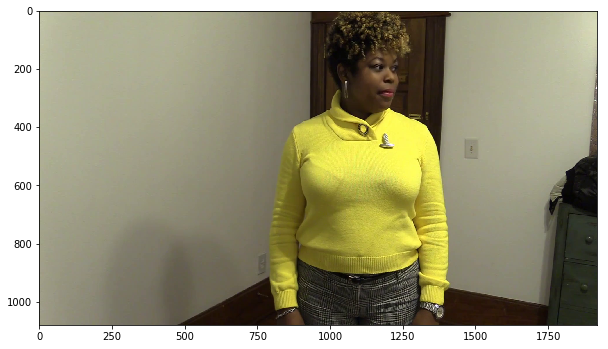

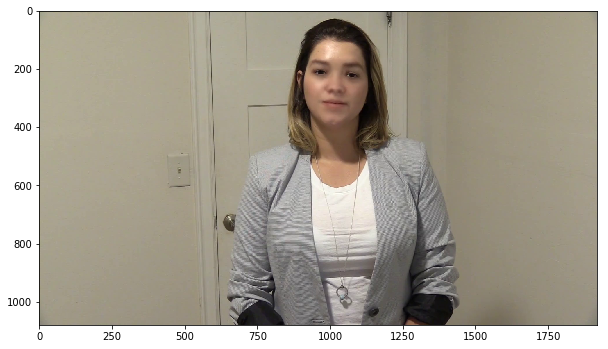

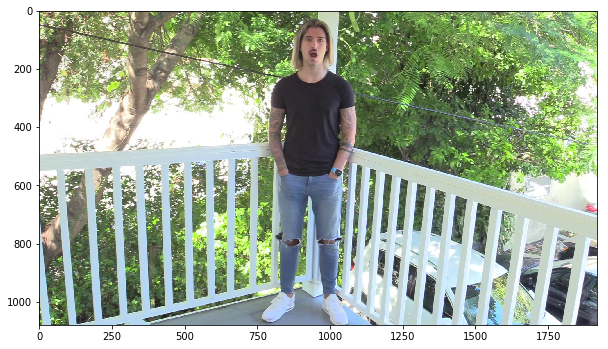

In [115]:
for video_file in fake_train_sample_video:
  display_image_from_video(os.path.join(DATA_FOLDER,TRAIN_SAMPLE_FOLDER,video_file))

In [116]:
real_train_sample_video = list(meta_train_df.loc[meta_train_df.label=='REAL'].sample(3).index) #viewing the real videos
real_train_sample_video

['ekcrtigpab.mp4', 'cppdvdejkc.mp4', 'dbnygxtwek.mp4']

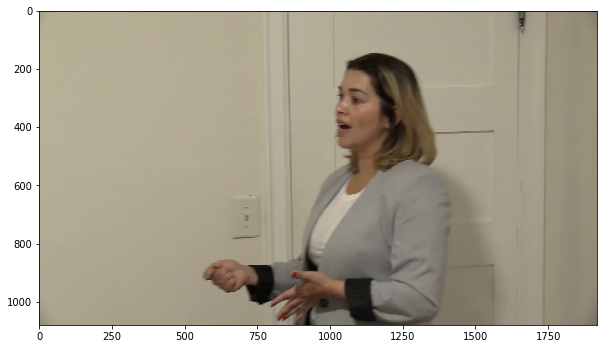

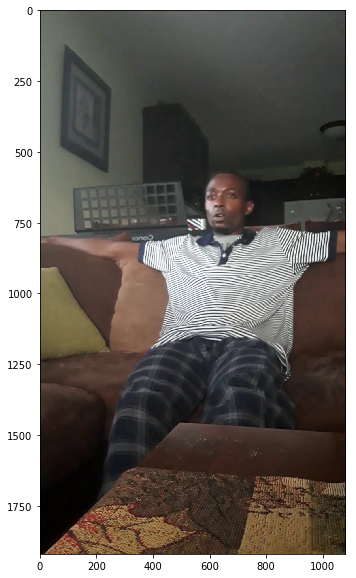

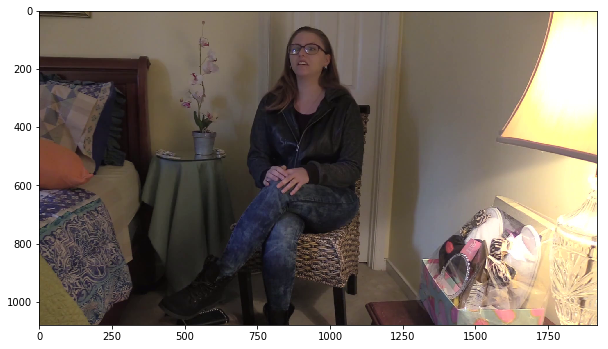

In [117]:
for video in real_train_sample_video:
  display_image_from_video(os.path.join(DATA_FOLDER,TRAIN_SAMPLE_FOLDER,video))

In [118]:
def display_image_from_video_list(video_path_list, video_folder=TRAIN_SAMPLE_FOLDER):
    '''
    input: video_path_list - path for video
    process:
    0. for each video in the video path list
        1. perform a video capture from the video
        2. read the image
        3. display the image
    '''
    plt.figure()
    fig, ax = plt.subplots(2,3,figsize=(16,8))
    #we only show images extracted from first 6 videos
    for i, video_file in enumerate(video_path_list[0:6]):
      video_path = os.path.join(DATA_FOLDER, video_folder, video_file)
      capture_img = cv.VideoCapture(video_path)
      ret, frame = capture_img.read()
      frame = cv.cvtColor(frame, cv.COLOR_BGR2RGB)
      ax[i//3, i%3].imshow(frame)
      ax[i//3, i%3].set_title(f"Video: {video_file}")
      ax[i//3, i%3].axis('on')

<Figure size 432x288 with 0 Axes>

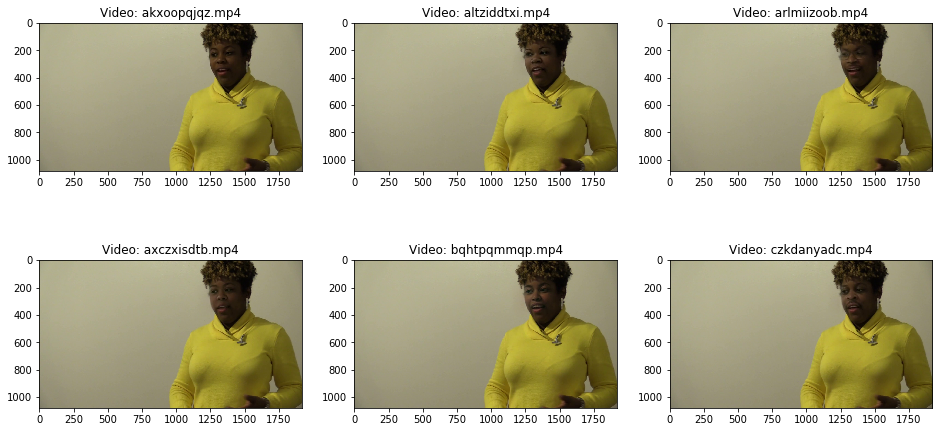

In [119]:
same_original_fake_train_sample_video = list(meta_train_df.loc[meta_train_df.original=='meawmsgiti.mp4'].index)
display_image_from_video_list(same_original_fake_train_sample_video)

In [120]:
!tar xvf /kaggle/input/ffmpeg-static-build/ffmpeg-git-amd64-static.tar.xz

ffmpeg-git-20191209-amd64-static/
ffmpeg-git-20191209-amd64-static/GPLv3.txt
ffmpeg-git-20191209-amd64-static/manpages/
ffmpeg-git-20191209-amd64-static/manpages/ffmpeg-all.txt
ffmpeg-git-20191209-amd64-static/manpages/ffmpeg-scaler.txt
ffmpeg-git-20191209-amd64-static/manpages/ffmpeg-resampler.txt
ffmpeg-git-20191209-amd64-static/manpages/ffmpeg-filters.txt
ffmpeg-git-20191209-amd64-static/manpages/ffprobe.txt
ffmpeg-git-20191209-amd64-static/manpages/ffmpeg-devices.txt
ffmpeg-git-20191209-amd64-static/manpages/ffmpeg-utils.txt
ffmpeg-git-20191209-amd64-static/manpages/ffmpeg-protocols.txt
ffmpeg-git-20191209-amd64-static/manpages/ffmpeg-codecs.txt
ffmpeg-git-20191209-amd64-static/manpages/ffmpeg-bitstream-filters.txt
ffmpeg-git-20191209-amd64-static/manpages/ffmpeg.txt
ffmpeg-git-20191209-amd64-static/manpages/ffmpeg-formats.txt
ffmpeg-git-20191209-amd64-static/ffprobe
ffmpeg-git-20191209-amd64-static/qt-faststart
ffmpeg-git-20191209-amd64-static/model/
ffmpeg-git-20191209-amd64-stat

In [121]:
import pandas as pd
import numpy as np
import glob, shutil
import timeit, os, gc
import subprocess as sp
from tqdm import tqdm
from collections import defaultdict
from concurrent.futures import ProcessPoolExecutor, ThreadPoolExecutor
import json
from IPython.display import HTML
from base64 import b64encode
import cv2
%matplotlib inline

In [122]:
HOME = "./"
FFMPEG = "/kaggle/working/ffmpeg-git-20191209-amd64-static"
FFMPEG_PATH = FFMPEG
DATA_FOLDER = "/kaggle/input/deepfake-detection-challenge"
TMP_FOLDER = HOME
DATA_FOLDER_TRAIN = DATA_FOLDER
VIDEOS_FOLDER_TRAIN = DATA_FOLDER_TRAIN + "/train_sample_videos"
IMAGES_FOLDER_TRAIN = TMP_FOLDER + "/images"
AUDIOS_FOLDER_TRAIN = TMP_FOLDER + "/audios"
EXTRACT_META = True # False
EXTRACT_CONTENT = True # False
EXTRACT_FACES = True # False
FRAME_RATE = 0.5 # Frame per
print(FFMPEG)

/kaggle/working/ffmpeg-git-20191209-amd64-static


In [123]:
def run_command(*popenargs, **kwargs):
    closeNULL = 0
    try:
        from subprocess import DEVNULL
        closeNULL = 0
    except ImportError:
        import os
        DEVNULL = open(os.devnull, 'wb')
        closeNULL = 1

    process = sp.Popen(stdout=sp.PIPE, stderr=DEVNULL, *popenargs, **kwargs)
    output, unused_err = process.communicate()
    retcode = process.poll()

    if closeNULL:
        DEVNULL.close()

    if retcode:
        cmd = kwargs.get("args")
        if cmd is None:
            cmd = popenargs[0]
        error = sp.CalledProcessError(retcode, cmd)
        error.output = output
        raise error
    return output

def ffprobe(filename, options = ["-show_error", "-show_format", "-show_streams", "-show_programs", "-show_chapters", "-show_private_data"]):
    ret = {}
    command = [FFMPEG_PATH + "/ffprobe", "-v", "error", *options, "-print_format", "json", filename]
    ret = run_command(command)
    if ret:
        ret = json.loads(ret)
    return ret

# ffmpeg -i input.mov -r 0.25 output_%04d.png
def ffextract_frames(filename, output_folder, rate = 0.25):
    command = [FFMPEG_PATH + "/ffmpeg", "-i", filename, "-r", str(rate), "-y", output_folder + "/output_%04d.png"]
    ret = run_command(command)
    return ret

# ffmpeg -i input-video.mp4 output-audio.mp3
def ffextract_audio(filename, output_path):
    command = [FFMPEG_PATH + "/ffmpeg", "-i", filename, "-vn", "-ac", "1", "-acodec", "copy", "-y", output_path]
    ret = run_command(command)
    return ret

In [124]:
if EXTRACT_META == True:
    results = []
    subfolder = VIDEOS_FOLDER_TRAIN
    filepaths = glob.glob(subfolder + "/*.mp4")
    for filepath in tqdm(filepaths):
        js = ffprobe(filepath)
#        print(js)
        if js:
            results.append(
                (js.get("format", {}).get("filename")[len(subfolder) + 1:],
                js.get("format", {}).get("format_long_name"),
                # Video 
                js.get("streams", [{}, {}])[0].get("codec_name"),
                js.get("streams", [{}, {}])[0].get("height"),
                js.get("streams", [{}, {}])[0].get("width"),
                js.get("streams", [{}, {}])[0].get("nb_frames"),
                js.get("streams", [{}, {}])[0].get("bit_rate"),
                js.get("streams", [{}, {}])[0].get("duration"),
                js.get("streams", [{}, {}])[0].get("start_time"),
                js.get("streams", [{}, {}])[0].get("avg_frame_rate"),
                 # Audio
                js.get("streams", [{}, {}])[1].get("codec_name"),
                js.get("streams", [{}, {}])[1].get("channels"),
                js.get("streams", [{}, {}])[1].get("sample_rate"),
                js.get("streams", [{}, {}])[1].get("nb_frames"),
                js.get("streams", [{}, {}])[1].get("bit_rate"),
                js.get("streams", [{}, {}])[1].get("duration"),
                js.get("streams", [{}, {}])[1].get("start_time")),
            )

    meta_pd = pd.DataFrame(results, columns=["filename", "format", "video_codec_name", "video_height", "video_width",
                                            "video_nb_frames", "video_bit_rate", "video_duration", "video_start_time","video_fps",
                                            "audio_codec_name", "audio_channels", "audio_sample_rate", "audio_nb_frames",
                                            "audio_bit_rate", "audio_duration", "audio_start_time"])
    meta_pd["video_fps"] = meta_pd["video_fps"].apply(lambda x: float(x.split("/")[0])/float(x.split("/")[1]) if len(x.split("/")) == 2 else None)
    meta_pd["video_duration"] = meta_pd["video_duration"].astype(np.float32)
    meta_pd["video_bit_rate"] = meta_pd["video_bit_rate"].astype(np.float32)
    meta_pd["video_start_time"] = meta_pd["video_start_time"].astype(np.float32)
    meta_pd["video_nb_frames"] = meta_pd["video_nb_frames"].astype(np.float32)
    meta_pd["video_bit_rate"] = meta_pd["video_bit_rate"].astype(np.float32)
    meta_pd["audio_sample_rate"] = meta_pd["audio_sample_rate"].astype(np.float32)
    meta_pd["audio_nb_frames"] = meta_pd["audio_nb_frames"].astype(np.float32)
    meta_pd["audio_bit_rate"] = meta_pd["audio_bit_rate"].astype(np.float32)
    meta_pd["audio_duration"] = meta_pd["audio_duration"].astype(np.float32)
    meta_pd["audio_start_time"] = meta_pd["audio_start_time"].astype(np.float32)
    meta_pd.to_pickle(HOME + "videos_meta.pkl")
else:
    meta_pd = pd.read_pickle(HOME + "videos_meta.pkl")
meta_pd.head()


100%|██████████| 400/400 [00:18<00:00, 21.66it/s]


,filename,format,video_codec_name,video_height,video_width,video_nb_frames,video_bit_rate,video_duration,video_start_time,video_fps,audio_codec_name,audio_channels,audio_sample_rate,audio_nb_frames,audio_bit_rate,audio_duration,audio_start_time
0,eivxffliio.mp4,QuickTime / MOV,h264,1080,1920,300.0,2732304.0,10.01001,0.0,29.97,aac,1,48000.0,470.0,69316.0,10.0,0.0
1,dwediigjit.mp4,QuickTime / MOV,h264,1080,1920,300.0,2644782.0,10.01001,0.0,29.97,aac,1,48000.0,470.0,69326.0,10.0,0.0
2,asvcrfdpnq.mp4,QuickTime / MOV,h264,1080,1920,300.0,9100671.0,10.01001,0.0,29.97,aac,1,48000.0,470.0,69259.0,10.0,0.0
3,dntkzzzcdh.mp4,QuickTime / MOV,h264,1080,1920,300.0,4432757.0,10.01001,0.0,29.97,aac,1,48000.0,470.0,69306.0,10.0,0.0
4,dboxtiehng.mp4,QuickTime / MOV,h264,1080,1920,300.0,2701532.0,10.01001,0.0,29.97,aac,1,48000.0,470.0,69320.0,10.0,0.0


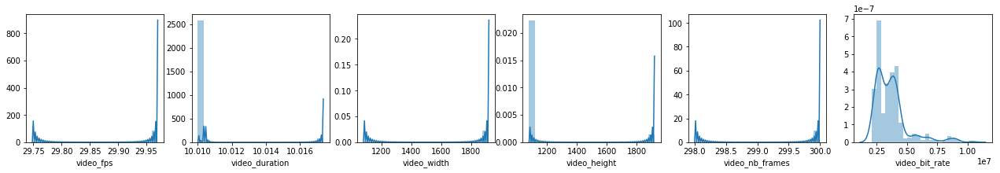

In [125]:
fig, ax = plt.subplots(1,6, figsize=(22, 3))
d = sns.distplot(meta_pd["video_fps"], ax=ax[0])
d = sns.distplot(meta_pd["video_duration"], ax=ax[1])
d = sns.distplot(meta_pd["video_width"], ax=ax[2])
d = sns.distplot(meta_pd["video_height"], ax=ax[3])
d = sns.distplot(meta_pd["video_nb_frames"], ax=ax[4])
d = sns.distplot(meta_pd["video_bit_rate"], ax=ax[5])

In [126]:
train_pd = pd.read_json(VIDEOS_FOLDER_TRAIN + "/metadata.json").T.reset_index().rename(columns={"index": "filename"})
train_pd.head()

,filename,label,split,original
0,aagfhgtpmv.mp4,FAKE,train,vudstovrck.mp4
1,aapnvogymq.mp4,FAKE,train,jdubbvfswz.mp4
2,abarnvbtwb.mp4,REAL,train,None
3,abofeumbvv.mp4,FAKE,train,atvmxvwyns.mp4
4,abqwwspghj.mp4,FAKE,train,qzimuostzz.mp4


In [127]:
train_pd = pd.read_json(VIDEOS_FOLDER_TRAIN + "/metadata.json").T.reset_index().rename(columns={"index": "filename"})
train_pd.head()

,filename,label,split,original
0,aagfhgtpmv.mp4,FAKE,train,vudstovrck.mp4
1,aapnvogymq.mp4,FAKE,train,jdubbvfswz.mp4
2,abarnvbtwb.mp4,REAL,train,None
3,abofeumbvv.mp4,FAKE,train,atvmxvwyns.mp4
4,abqwwspghj.mp4,FAKE,train,qzimuostzz.mp4


In [128]:
train_pd = pd.merge(train_pd, meta_pd[["filename", "video_height", "video_width", "video_nb_frames", "video_bit_rate", "audio_nb_frames"]], on="filename", how="left")
train_pd["count"] = train_pd.groupby(["original"])["original"].transform('count')
# train_pd.to_pickle(HOME + "train_meta.pkl")
train_pd.head()

,filename,label,split,original,video_height,video_width,video_nb_frames,video_bit_rate,audio_nb_frames,count
0,aagfhgtpmv.mp4,FAKE,train,vudstovrck.mp4,1080,1920,300.0,8650134.0,470.0,1.0
1,aapnvogymq.mp4,FAKE,train,jdubbvfswz.mp4,1080,1920,300.0,3494923.0,470.0,2.0
2,abarnvbtwb.mp4,REAL,train,None,1080,1920,300.0,3942492.0,470.0,NaN
3,abofeumbvv.mp4,FAKE,train,atvmxvwyns.mp4,1080,1920,300.0,2156072.0,470.0,6.0
4,abqwwspghj.mp4,FAKE,train,qzimuostzz.mp4,1080,1920,300.0,2728571.0,470.0,3.0


In [129]:
AUDIO_FORMAT = "aac" # "wav"
videos_folder = VIDEOS_FOLDER_TRAIN
images_folder_path = IMAGES_FOLDER_TRAIN
audios_folder_path = AUDIOS_FOLDER_TRAIN
if EXTRACT_CONTENT == True:
    # 1h20min for chunk#0 (11GB)
    # Extract some images + audio track
    for idx, row in tqdm(train_pd.iterrows(), total=meta_pd.shape[0]):
        try:
            video_path = videos_folder + "/" + row["filename"]
            images_path = images_folder_path + "/" + row["filename"][:-4]
            audio_path = audios_folder_path + "/" + row["filename"][:-4]
            # Extract images
            if not os.path.exists(images_path): os.makedirs(images_path)
            ret = ffextract_frames(video_path, images_path, rate = FRAME_RATE)
            # Extract audio
            if not os.path.exists(audio_path): os.makedirs(audio_path)
            # ret = ffextract_audio(video_path, audio_path + "/audio." + AUDIO_FORMAT)
        except:
            print("Cannot extract frames/audio for:" + row["filename"])


  2%|▎         | 10/400 [00:16<08:49,  1.36s/it]

Cannot extract frames/audio for:aczrgyricp.mp4



  3%|▎         | 12/400 [00:19<09:10,  1.42s/it]

Cannot extract frames/audio for:adohikbdaz.mp4



100%|██████████| 400/400 [12:30<00:00,  1.88s/it]


In [130]:
train_pd.tail()

,filename,label,split,original,video_height,video_width,video_nb_frames,video_bit_rate,audio_nb_frames,count
395,etejaapnxh.mp4,FAKE,train,wtreibcmgm.mp4,1080,1920,300.0,4129098.0,470.0,2.0
396,etmcruaihe.mp4,FAKE,train,afoovlsmtx.mp4,1920,1080,300.0,2670789.0,432.0,1.0
397,etohcvnzbj.mp4,FAKE,train,bdnaqemxmr.mp4,1080,1920,300.0,6816451.0,470.0,1.0
398,eudeqjhdfd.mp4,REAL,train,None,1080,1920,300.0,5651024.0,470.0,NaN
399,eukvucdetx.mp4,FAKE,train,gjypopglvi.mp4,1080,1920,300.0,2440299.0,470.0,4.0


In [131]:
idx = 12
fake = train_pd["filename"][idx]
real = train_pd["original"][idx]
vid_width = train_pd["video_width"][idx]
vid_real = open(VIDEOS_FOLDER_TRAIN + "/" + real, 'rb').read()
data_url_real = "data:video/mp4;base64," + b64encode(vid_real).decode()
vid_fake = open(VIDEOS_FOLDER_TRAIN + "/" + fake, 'rb').read()
data_url_fake = "data:video/mp4;base64," + b64encode(vid_fake).decode()
HTML("""
<div style='width: 100%%; display: table;'>
    <div style='display: table-row'>
        <div style='width: %dpx; display: table-cell;'><b>Real</b>: %s<br/><video width=%d controls><source src="%s" type="video/mp4"></video></div>
        <div style='display: table-cell;'><b>Fake</b>: %s<br/><video width=%d controls><source src="%s" type="video/mp4"></video></div>
    </div>
</div>
""" % ( int(vid_width/3.2) + 10, 
       real, int(vid_width/3.2), data_url_real, 
       fake, int(vid_width/3.2), data_url_fake))

In [132]:
face_cascade = cv2.CascadeClassifier(cv2.data.haarcascades + "haarcascade_frontalface_default.xml")

def detect_face_cv2(img):
    # Move to grayscale
    gray_img = cv2.cvtColor(img.copy(), cv2.COLOR_RGB2GRAY)
    face_locations = []
    face_rects = face_cascade.detectMultiScale(gray_img, scaleFactor=1.3, minNeighbors=5)     
    for (x,y,w,h) in face_rects: 
        face_location = (x,y,w,h)
        face_locations.append((face_location, 1.0))
    return face_locations

In [133]:
pip install mtcnn

     |████████████████████████████████| 2.3MB 1.4MB/s eta 0:00:01
Note: you may need to restart the kernel to use updated packages.


In [134]:
from mtcnn import MTCNN
detector = MTCNN()

def detect_face_mtcnn(img):
    face_locations = []
    items = detector.detect_faces(img)
    for face in items:
        face_location = tuple(face.get('box'))
        face_confidence = float(face.get('confidence'))
        face_locations.append((face_location, face_confidence))
    return face_locations

In [135]:
def extract_faces(files, source, detector=detect_face_cv2):
    results = []
    # for idx, file in tqdm(enumerate(files), total=len(files)):
    for idx, file in enumerate(files):
        try:
            img = cv2.cvtColor(cv2.imread(file, cv2.IMREAD_UNCHANGED), cv2.COLOR_BGR2RGB)
            face_locations = detector(img)
            results.append((source, file[file.find("output_"):], face_locations, len(face_locations)))
        except:
            print("Cannot extract faces for image: %s" % file)
    return results

In [136]:
file = fake
dump_folder = images_folder_path + "/" + file[:-4]
files = glob.glob(dump_folder + "/*")
DETECTORS = {
    "cv2": detect_face_cv2,
    "mtcnn": detect_face_mtcnn
}
faces_pd = None
for key, value in DETECTORS.items():
    tmp_pd = pd.DataFrame(extract_faces(files, file, detector=value), columns=["filename", "image", "boxes_" + key , "faces_" + key])
    if faces_pd is None:
        faces_pd = tmp_pd
    else:
        faces_pd = pd.merge(faces_pd, tmp_pd, on=["filename", "image"], how="left")
faces_pd.head(12)

,filename,image,boxes_cv2,faces_cv2,boxes_mtcnn,faces_mtcnn
0,adylbeequz.mp4,output_0006.png,"[((741, 90, 226, 226), 1.0)]",1,"[((755, 84, 187, 238), 0.999956488609314)]",1
1,adylbeequz.mp4,output_0005.png,"[((760, 86, 233, 233), 1.0)]",1,"[((775, 89, 175, 228), 0.9999874830245972)]",1
2,adylbeequz.mp4,output_0002.png,"[((705, 89, 216, 216), 1.0)]",1,"[((735, 84, 181, 234), 0.9998886585235596)]",1
3,adylbeequz.mp4,output_0004.png,"[((708, 89, 211, 211), 1.0)]",1,"[((733, 84, 181, 234), 0.9998348951339722)]",1
4,adylbeequz.mp4,output_0001.png,"[((706, 90, 217, 217), 1.0)]",1,"[((735, 84, 181, 234), 0.9999085664749146)]",1
5,adylbeequz.mp4,output_0007.png,"[((713, 91, 221, 221), 1.0)]",1,"[((736, 85, 180, 235), 0.9998716115951538)]",1
6,adylbeequz.mp4,output_0003.png,"[((707, 89, 214, 214), 1.0)]",1,"[((735, 85, 179, 231), 0.9997808337211609)]",1


In [137]:
def plot_faces_boxes(df, max_cols = 2, max_rows = 6, fsize=(24, 5), max_items=12):    
    idx = 0    
    for item_idx, item in df.iterrows():
        img = cv2.cvtColor(cv2.imread(IMAGES_FOLDER_TRAIN + "/" + item["filename"][:-4] +"/" + item["image"], cv2.IMREAD_UNCHANGED), cv2.COLOR_BGR2RGB)    
        face_img = img #.copy()
        # grid subplots
        row = idx // max_cols
        col = idx % max_cols
        if col == 0: fig = plt.figure(figsize=fsize)
        ax = fig.add_subplot(1, max_cols, col + 1)
        ax.axis("off")
        # display image with boxes
        cols = [c for c in df.columns if "boxes" in c]
        for i, c in enumerate(cols, 0):
            face_locations = item[c]
            face_confidence = item[c]            
            if len(face_locations) > 0:
                for face_location in face_locations:        
                    ((x,y,w,h), confidence) = face_location
                    # face_img = face_img[y:y+h, x:x+w]
                    cv2.rectangle(face_img, (x, y), (x+w, y+h), (255,i*255,0), 8)
                    cv2.putText(face_img, '%.1f' % (confidence*100.0), (x+w, y+h), cv2.FONT_HERSHEY_SIMPLEX, 2.0, (255,i*255,0), 9, cv2.LINE_AA)
                ax.imshow(face_img)
            else:
                ax.imshow(img)
            ax.set_title("%s %s / %s - Faces: %d %s %s" % (item["label"] if "label" in df.columns else "", 
                                                           item["filename"], item["image"],
                                                           item["faces_mtcnn"] if "faces_mtcnn" in df.columns else len(face_locations),
                                                           item["faces_mtcnn_median"] if "faces_mtcnn_median" in df.columns else "",
                                                           item["faces"] if "faces" in df.columns else ""))
        if (col == max_cols -1): plt.show()
        idx = idx + 1
        if (max_items > 0 and idx >=max_items): break

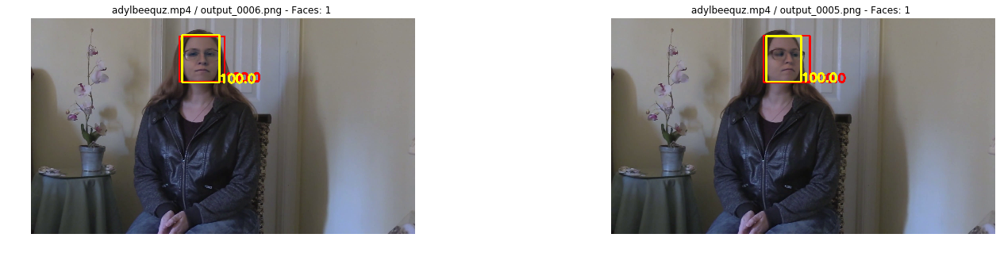

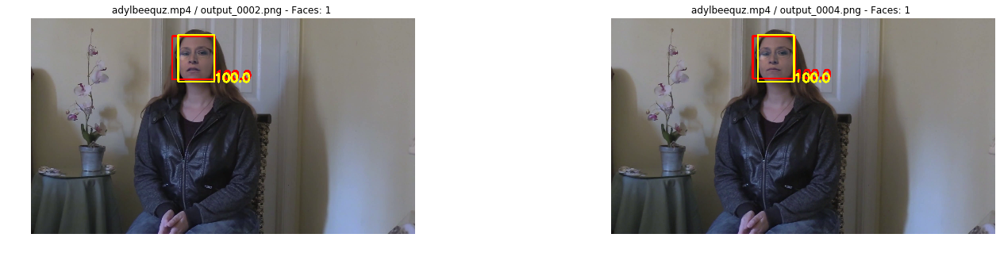

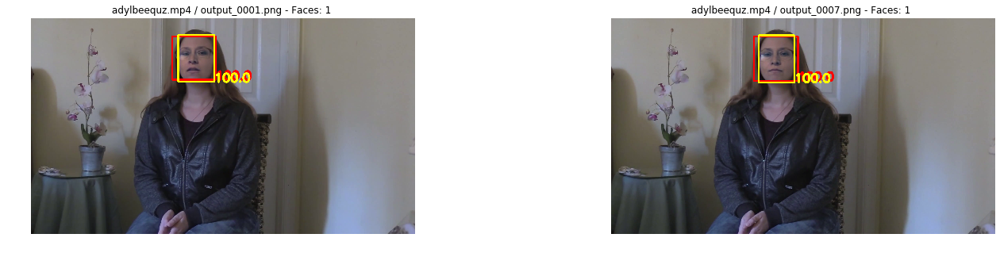

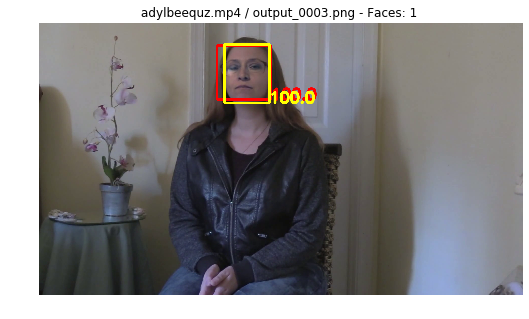

In [138]:
plot_faces_boxes(faces_pd)

In [139]:
def run_detector_on_video(videos_filename, verbose=False):
    if verbose == True: 
        print("Starting with batch of %d videos" % len(videos_filename))
    tmp_faces_pd = None
    for file in videos_filename:
        # Find out dump folder with images
        dump_folder = images_folder_path + "/" + file[:-4]
        # List files
        files = glob.glob(dump_folder + "/*")
        DETECTORS = {
            "mtcnn": detect_face_mtcnn
        }
        for key, value in DETECTORS.items():
            tmp_pd = pd.DataFrame(extract_faces(files, file, detector=value), columns=["filename", "image", "boxes_" + key , "faces_" + key])
            if tmp_faces_pd is None:
                tmp_faces_pd = tmp_pd
            else:
                tmp_faces_pd = pd.concat([tmp_faces_pd, tmp_pd], axis=0)
    return tmp_faces_pd

In [140]:
import multiprocessing
cpus = multiprocessing.cpu_count()
if EXTRACT_FACES == True:
    resultfutures = []
    results = []
    tasks = np.array_split(train_pd["filename"].unique(), 20)
    print("Tasks: %d" % len(tasks))
    with ThreadPoolExecutor(max_workers=cpus) as executor:
        resultfutures = tqdm(executor.map(run_detector_on_video, tasks), total=len(tasks))
    results = [x for x in resultfutures]
    executor.shutdown()
    # Gather results
    all_faces_pd = None
    for result in results:
        if all_faces_pd is None:
            all_faces_pd = result
        else:
            all_faces_pd = pd.concat([all_faces_pd, result], axis=0)
    all_faces_pd = all_faces_pd.reset_index(drop=True)
    all_faces_pd.to_pickle(HOME + "faces.pkl")
else:
    all_faces_pd = pd.read_pickle(HOME + "faces.pkl")
print(all_faces_pd.shape)


  0%|          | 0/20 [00:00<?, ?it/s]

Tasks: 20



100%|██████████| 20/20 [27:05<00:00, 81.28s/it]   

(2792, 4)


In [141]:
all_faces_pd["faces_mtcnn_avg"] = all_faces_pd.groupby("filename")["faces_mtcnn"].transform(np.nanmean)
all_faces_pd["faces_mtcnn_median"] = all_faces_pd.groupby("filename")["faces_mtcnn"].transform(np.nanmedian)
all_faces_pd.head()

,filename,image,boxes_mtcnn,faces_mtcnn,faces_mtcnn_avg,faces_mtcnn_median
0,aagfhgtpmv.mp4,output_0006.png,"[((996, 121, 203, 272), 0.9999922513961792), (...",2,1.285714,1
1,aagfhgtpmv.mp4,output_0005.png,"[((1056, 129, 203, 276), 0.9999473094940186), ...",2,1.285714,1
2,aagfhgtpmv.mp4,output_0002.png,"[((338, 167, 220, 292), 0.9999215602874756)]",1,1.285714,1
3,aagfhgtpmv.mp4,output_0004.png,"[((1117, 162, 221, 309), 0.999996542930603)]",1,1.285714,1
4,aagfhgtpmv.mp4,output_0001.png,"[((338, 167, 219, 292), 0.9999223947525024)]",1,1.285714,1


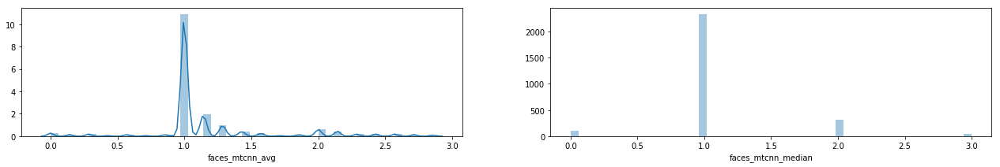

In [142]:
fig, ax = plt.subplots(1, 2, figsize=(22, 3))
d = sns.distplot(all_faces_pd["faces_mtcnn_avg"], kde=True, ax=ax[0])
d = sns.distplot(all_faces_pd["faces_mtcnn_median"], kde=False, ax=ax[1])

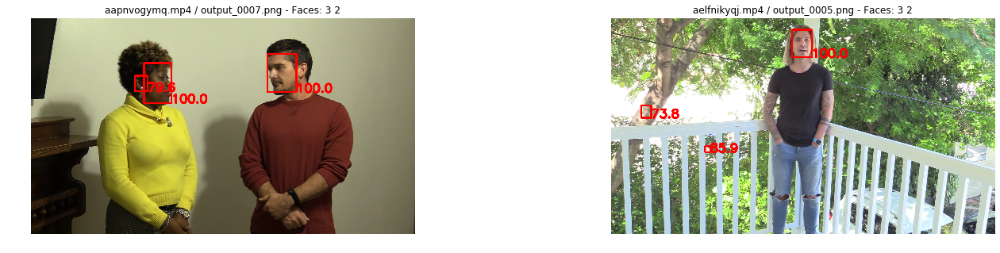

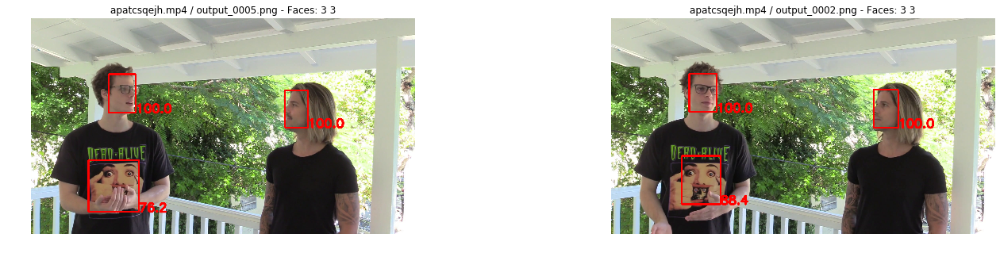

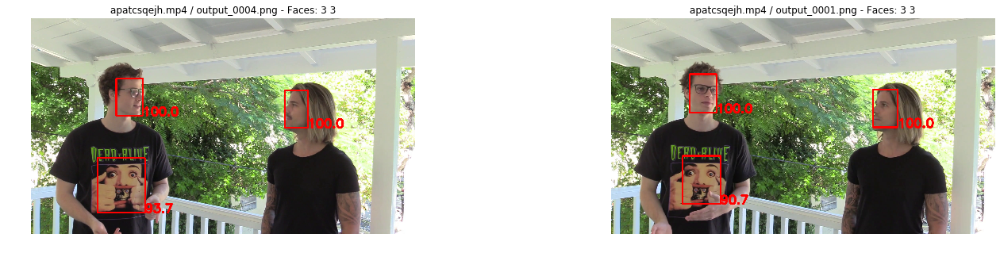

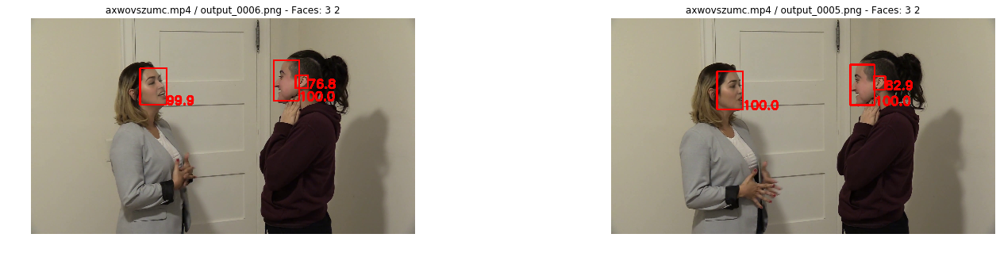

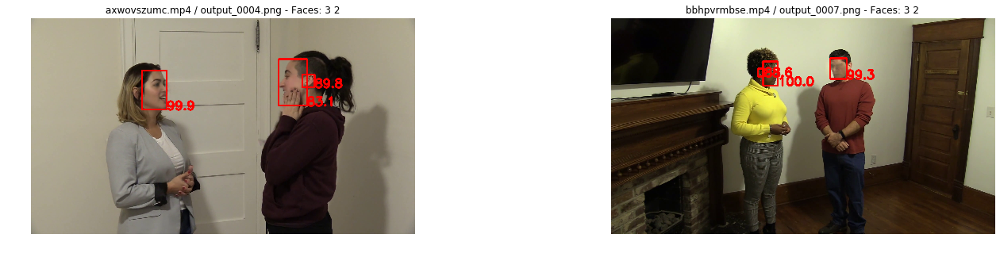

...

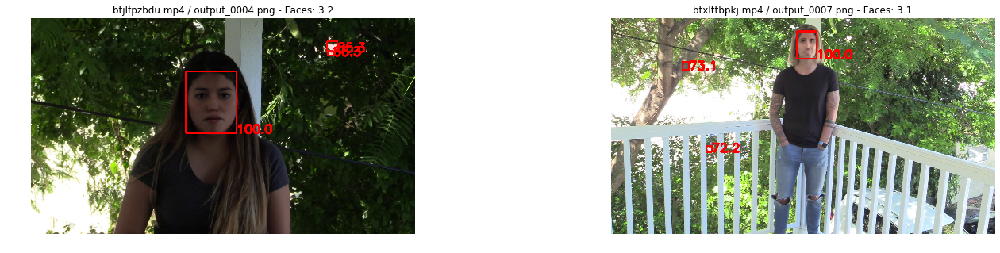

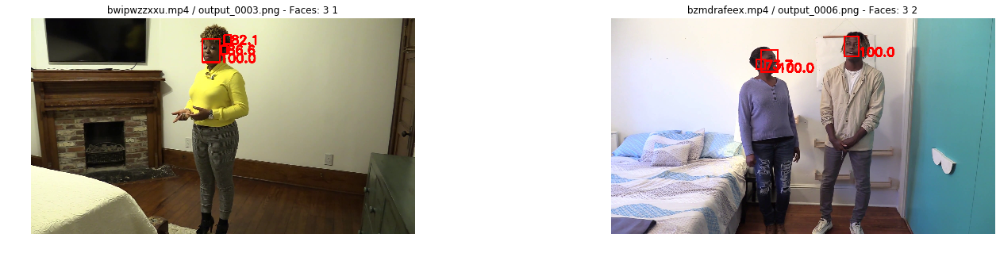

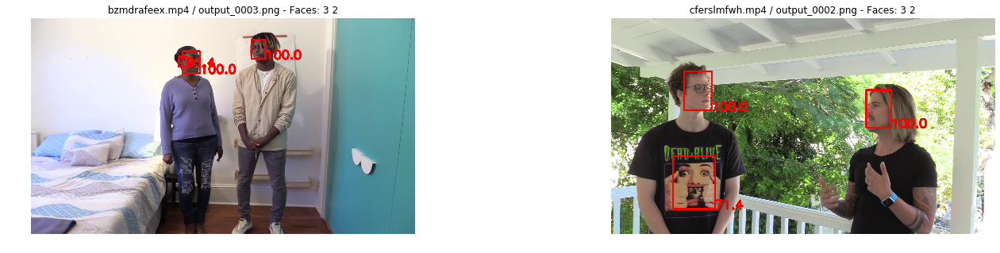

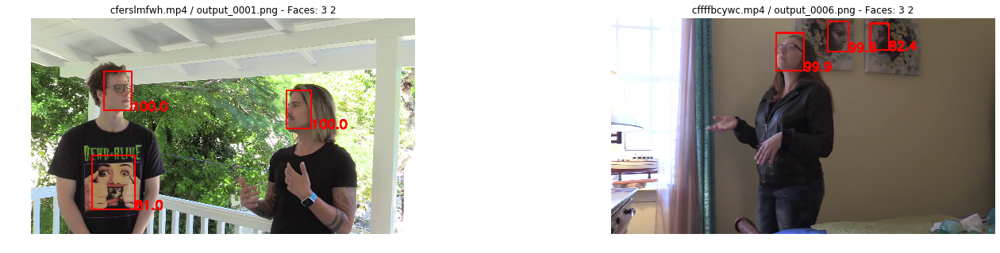

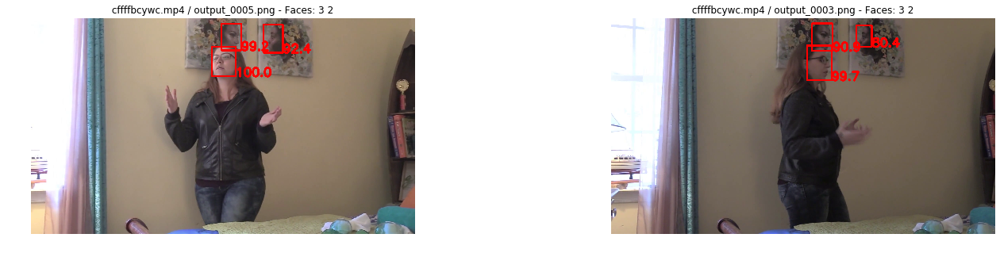

In [143]:
plot_faces_boxes(all_faces_pd[all_faces_pd["faces_mtcnn"] == 3], max_items=24)

In [144]:
clean_faces_pd = pd.merge(all_faces_pd, train_pd, on="filename", how="left")
clean_faces_pd.head()

,filename,image,boxes_mtcnn,faces_mtcnn,faces_mtcnn_avg,faces_mtcnn_median,label,split,original,video_height,video_width,video_nb_frames,video_bit_rate,audio_nb_frames,count
0,aagfhgtpmv.mp4,output_0006.png,"[((996, 121, 203, 272), 0.9999922513961792), (...",2,1.285714,1,FAKE,train,vudstovrck.mp4,1080,1920,300.0,8650134.0,470.0,1.0
1,aagfhgtpmv.mp4,output_0005.png,"[((1056, 129, 203, 276), 0.9999473094940186), ...",2,1.285714,1,FAKE,train,vudstovrck.mp4,1080,1920,300.0,8650134.0,470.0,1.0
2,aagfhgtpmv.mp4,output_0002.png,"[((338, 167, 220, 292), 0.9999215602874756)]",1,1.285714,1,FAKE,train,vudstovrck.mp4,1080,1920,300.0,8650134.0,470.0,1.0
3,aagfhgtpmv.mp4,output_0004.png,"[((1117, 162, 221, 309), 0.999996542930603)]",1,1.285714,1,FAKE,train,vudstovrck.mp4,1080,1920,300.0,8650134.0,470.0,1.0
4,aagfhgtpmv.mp4,output_0001.png,"[((338, 167, 219, 292), 0.9999223947525024)]",1,1.285714,1,FAKE,train,vudstovrck.mp4,1080,1920,300.0,8650134.0,470.0,1.0


In [145]:
def faces_max_item(boxes, idx1, idx2):
    ret = 0
    if len(boxes) > 0:
        ret = max(boxes, key=lambda item: item[idx1][idx2])[idx1][idx2]
    return ret

def faces_max_confidence(boxes):
    ret = 0
    if len(boxes) > 0:
        ret = max(boxes, key=lambda item: item[1])[1]
    return ret

def faces_min_confidence(boxes):
    ret = 0
    if len(boxes) > 0:
        ret = min(boxes, key=lambda item: item[1])[1]
    return ret

clean_faces_pd["faces_max_width"] = clean_faces_pd["boxes_mtcnn"].apply(lambda x: faces_max_item(x, 0, 2)) 
clean_faces_pd["faces_max_height"] = clean_faces_pd["boxes_mtcnn"].apply(lambda x: faces_max_item(x, 0, 3))
clean_faces_pd["faces_max_conf"] = clean_faces_pd["boxes_mtcnn"].apply(lambda x: faces_max_confidence(x))
clean_faces_pd["faces_min_conf"] = clean_faces_pd["boxes_mtcnn"].apply(lambda x: faces_min_confidence(x))

Faces stats:
       faces_max_width  faces_max_height  faces_min_conf  faces_max_conf
count      2792.000000       2792.000000     2792.000000     2792.000000
mean        152.148997        198.502149        0.943950        0.960794
std          60.261213         77.811005        0.191877        0.186667
min           0.000000          0.000000        0.000000        0.000000
1%            0.000000          0.000000        0.000000        0.000000
5%           75.000000        101.000000        0.729895        0.914721
10%          83.000000        109.000000        0.833806        0.998282
25%         100.000000        132.000000        0.999360        0.999777
50%         170.000000        218.000000        0.999953        0.999973
75%         198.000000        258.000000        0.999994        0.999996
90%         228.000000        298.000000        0.999999        0.999999
95%         240.000000        311.000000        1.000000        1.000000
99%         258.000000        331.0000

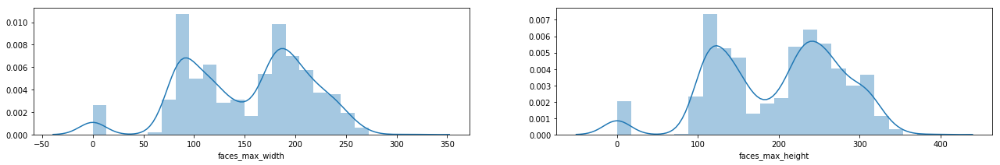

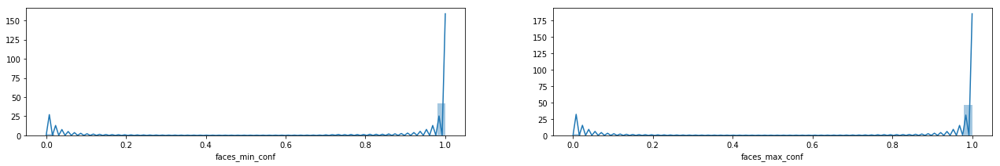

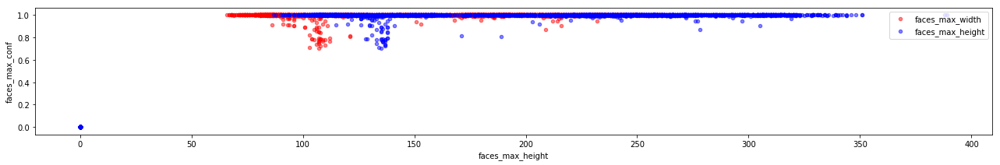

In [146]:
print("Faces stats:")
print(clean_faces_pd[["faces_max_width", "faces_max_height", "faces_min_conf", "faces_max_conf"]].describe(percentiles=[0.01,0.05, 0.1,0.25,0.5,0.75,0.9,0.95,0.99]))
fig, ax = plt.subplots(1, 2, figsize=(22, 3))
d = sns.distplot(clean_faces_pd["faces_max_width"], kde=True, ax=ax[0])
d = sns.distplot(clean_faces_pd["faces_max_height"], kde=True, ax=ax[1])
plt.show()
fig, ax = plt.subplots(1, 2, figsize=(22, 3))
d = sns.distplot(clean_faces_pd["faces_min_conf"], kde=True, ax=ax[0])
d = sns.distplot(clean_faces_pd["faces_max_conf"], kde=True, ax=ax[1])
fig, ax = plt.subplots(figsize=(22, 3))
d = clean_faces_pd.plot(kind="scatter", x="faces_max_width", y="faces_max_conf", c="red", ax=ax, label="faces_max_width", alpha=0.5)
d = clean_faces_pd.plot(kind="scatter", x="faces_max_height", y="faces_max_conf", c="blue", ax=d,  label="faces_max_height", alpha=0.5)
d = plt.legend(loc="upper right")

In [147]:
!pip install imutils

  Created wheel for imutils: filename=imutils-0.5.4-cp36-none-any.whl size=25858 sha256=2c2acca0f86be13232c0af83d783bac4e637c1fa9c0e6a144865f79859c07b41
  Stored in directory: /root/.cache/pip/wheels/db/23/45/fc7424906880ffa9577a2a428b961f2b79e0e21d9f71e7e6bc
Successfully built imutils


In [148]:
import os
import numpy as np
import shutil
import cv2
import pandas as pd
import matplotlib
matplotlib.use("Agg")
import matplotlib.pyplot as plt
import numpy as np
import pickle
from imutils import paths
from keras.preprocessing.image import ImageDataGenerator
from keras.applications import VGG16
from keras.layers.core import Dropout
from keras.layers.core import Flatten
from keras.layers.core import Dense
from keras.layers import Input
from keras.models import Model
from keras.optimizers import SGD
from sklearn.metrics import classification_report
%matplotlib inline

Using TensorFlow backend.


In [149]:
BASE_PATH = "/kaggle/working/finetuningkeras/dataset"

# define the names of the training, testing, and validation
# directories
TRAIN = "training"
TEST = "evaluation"
VAL = "validation"

REAL = 'REAL'
FAKE = 'FAKE'

# initialize the list of class label names
CLASSES = ["FAKE", "REAL"]


# set the batch size when fine-tuning
BATCH_SIZE = 32

trainEpochs = 10
epochsFineTune = 10
maxVids = 5

# set the path to the serialized model after training
MODEL_PATH = os.path.sep.join(["/kaggle/working/finetuningkeras","output", "Deepfake.model"])

# define the path to the output training history plots
UNFROZEN_PLOT_PATH = os.path.sep.join(["/kaggle/working/finetuningkeras","output", "unfrozen.png"])
WARMUP_PLOT_PATH = os.path.sep.join(["/kaggle/working/finetuningkeras","output", "warmup.png"])

file = '/kaggle/input/deepfake-detection-challenge/train_sample_videos/metadata.json'
img_path = '/kaggle/input/deepfake-detection-challenge/train_sample_videos'
data_path = '/kaggle/working/finetuningkeras/real_fake'
dir_fake_frames = '/kaggle/working/FAKE_frames'
dir_real_frames = '/kaggle/working/REAL_frames'
dir_output = '/kaggle/working/finetuningkeras/output'

dir_data_path_real = os.path.join(data_path, REAL)
dir_data_path_fake = os.path.join(data_path, FAKE)

dir_train_real = os.path.join(BASE_PATH, TRAIN, REAL)
dir_train_fake = os.path.join(BASE_PATH, TRAIN, FAKE)
dir_valid_real = os.path.join(BASE_PATH, VAL, REAL)
dir_valid_fake = os.path.join(BASE_PATH, VAL, FAKE)
dir_test_real = os.path.join(BASE_PATH, TEST, REAL)
dir_test_fake = os.path.join(BASE_PATH, TEST, FAKE)

In [150]:
input_dir = '/kaggle/working/finetuningkeras/real_fake/FAKE'
output_dir = '/kaggle/working/FAKE_frames/'
def explode_frames(input_dir, output_dir, maxN):

    mp4_filenames = [f for f in os.listdir(input_dir) if f.endswith('.mp4')]
    n = 0
    
    for mp4fn in mp4_filenames:
        
        if(n < maxN):
            n += 1 
            mp4fp = os.path.join(input_dir, mp4fn)
            cam = cv2.VideoCapture(mp4fp) 
            if(cam.isOpened()):
                print('Processing file #'+ str(n) + ' (' + mp4fn + ')...')
            else: 
                print('Problem opening file #'+ str(n) + ' (' + mp4fn + ')...')
                continue 
            
            nframe = 0
            while(True): #continue until ret = False then break
                nframe += 1
                ret,frame = cam.read()
                
                if ret: 
                    # if video is still left continue creating images 
                    out_filename = os.path.splitext(mp4fn)[0]+  '_frame' + str(nframe) + '.jpg'
                    out_filepath =  os.path.join(output_dir, out_filename)
                    
                    # writing the extracted images 
                    cv2.imwrite(out_filepath, frame) 
                else: 
                    break

            # Release all space and windows once done
            print(' - created ' + str(nframe-1) + ' images') # -1 bc count incremented before exit
            cam.release() 
            cv2.destroyAllWindows()
            
        else: 
            break
            
"""
Distribute files/images from a source directory into training, validation, and testing directories. 
src_dir = source/input directory
train_dir, val_dir, test_dir = target training/validation/testing directory
valperc = fraction of dataset to use for validation (0-1)
testperc = fraction of dataset to use for testing (0-1)
"""
            
def trainvaltest_split(src_dir, train_dir, val_dir, test_dir, valperc = 0.15, testperc = 0.15):
    
    filenames = os.listdir(src_dir) #get all filenames in random order
    np.random.shuffle(filenames)
    
    n = len(filenames)
    split1 = int(n*(1 - (valperc + testperc)))
    split2 = int(n*(1 - (testperc)))
    
    fn_train, fn_val, fn_test = np.split(np.array(filenames), [split1, split2])
    
    fn_lists = [fn_train, fn_val, fn_test]
    targetdirs = [train_dir, val_dir, test_dir]
    
    print('Total images: ', n)
    print('Training: ', len(fn_train))
    print('Validation: ', len(fn_val))
    print('Testing: ', len(fn_test))
    
    all_fp = [os.path.join(src_dir, fn) for fn in filenames]
    
    #move files
    for i, fn_list in enumerate(fn_lists):
        for fn in fn_list: 
            target_dir = targetdirs[i]
            fp_from = os.path.join(src_dir, fn)
            fp_to = os.path.join(target_dir, fn)
            
            shutil.move(fp_from, fp_to)

            
"""
Construct a plot that plots and saves the training history
"""           
def plot_training(H, N, plotPath):
	plt.style.use("ggplot")
	plt.figure()
	plt.plot(np.arange(0, N), H.history["loss"], label="train_loss")
	plt.plot(np.arange(0, N), H.history["val_loss"], label="val_loss")
	plt.plot(np.arange(0, N), H.history["accuracy"], label="train_acc")
	plt.plot(np.arange(0, N), H.history["val_accuracy"], label="val_acc")
	plt.title("Training Loss and Accuracy")
	plt.xlabel("Epoch #")
	plt.ylabel("Loss/Accuracy")
	plt.legend(loc="lower left")
	plt.savefig(plotPath)

In [151]:

os.makedirs(dir_train_real, exist_ok = True)
os.makedirs(dir_train_fake, exist_ok = True)
os.makedirs(dir_valid_real, exist_ok = True)
os.makedirs(dir_valid_fake, exist_ok = True)
os.makedirs(dir_test_real, exist_ok = True)
os.makedirs(dir_test_fake, exist_ok = True)

os.makedirs(dir_data_path_real, exist_ok = True)
os.makedirs(dir_data_path_fake, exist_ok = True)
os.makedirs(dir_fake_frames, exist_ok = True) 
os.makedirs(dir_real_frames, exist_ok = True) 
os.makedirs(dir_output, exist_ok = True)

In [152]:
df = pd.read_json(file)
df = df.T

# %% [code]
label = df[['label']]

In [153]:
for fn, row in label.iterrows():
    src = os.path.join(img_path, fn)
    dest = os.path.join(data_path, row['label'], fn)
    shutil.copy(src, dest)

In [154]:
explode_frames(dir_data_path_fake, dir_fake_frames, maxN= maxVids)

Processing file #1 (eebrkicpry.mp4)...
 - created 300 images
Processing file #2 (ebeknhudxq.mp4)...
 - created 300 images
Processing file #3 (dnhvalzvrt.mp4)...
 - created 300 images
Processing file #4 (dozyddhild.mp4)...
 - created 298 images
Processing file #5 (cxfujlvsuw.mp4)...
 - created 300 images


In [155]:
explode_frames(dir_data_path_real, dir_real_frames, maxN= maxVids)

Processing file #1 (efwfxwwlbw.mp4)...
 - created 300 images
Processing file #2 (eckvhdusax.mp4)...
 - created 300 images
Processing file #3 (bulkxhhknf.mp4)...
 - created 300 images
Processing file #4 (bwhlgysghg.mp4)...
 - created 300 images
Processing file #5 (ahqqqilsxt.mp4)...
 - created 300 images


In [156]:
trainvaltest_split(src_dir = dir_fake_frames,
                   train_dir = dir_train_fake, 
                   val_dir = dir_valid_fake, 
                   test_dir = dir_test_fake)

Total images:  1498
Training:  1048
Validation:  225
Testing:  225


In [157]:
trainvaltest_split(src_dir = dir_real_frames,
                   train_dir = dir_train_real, 
                   val_dir = dir_valid_real, 
                   test_dir = dir_test_real)

Total images:  1500
Training:  1050
Validation:  225
Testing:  225


In [158]:

trainAug = ImageDataGenerator(
	rotation_range=30,
	zoom_range=0.15,
	width_shift_range=0.2,
	height_shift_range=0.2,
	shear_range=0.15,
	horizontal_flip=True,
	fill_mode="nearest")

In [159]:
valAug = ImageDataGenerator()

In [160]:
mean = np.array([123.68, 116.779, 103.939], dtype="float32")
trainAug.mean = mean
valAug.mean = mean

In [161]:
trainPath = os.path.join(BASE_PATH, TRAIN)
trainGen = trainAug.flow_from_directory(
	trainPath,
	class_mode="categorical",
	target_size=(224, 224),
	color_mode="rgb",
	shuffle=True,
	batch_size=BATCH_SIZE)

# initialize the validation generator
valPath = os.path.join(BASE_PATH, VAL)
valGen = valAug.flow_from_directory(
	valPath,
	class_mode="categorical",
	target_size=(224, 224),
	color_mode="rgb",
	shuffle=False,
	batch_size=BATCH_SIZE)

# initialize the testing generator
testPath = os.path.join(BASE_PATH, TEST)
testGen = valAug.flow_from_directory(
	testPath,
	class_mode="categorical",
	target_size=(224, 224),
	color_mode="rgb",
	shuffle=False,
	batch_size=BATCH_SIZE)

Found 2098 images belonging to 2 classes.
Found 450 images belonging to 2 classes.
Found 450 images belonging to 2 classes.


In [162]:
baseModel = VGG16(weights="imagenet", include_top=False,
	input_tensor=Input(shape=(224, 224, 3)))

58892288/58889256 [==============================] - 0s 0us/step


In [163]:
headModel = baseModel.output
headModel = Flatten(name="flatten")(headModel)
headModel = Dense(512, activation="relu")(headModel)
headModel = Dropout(0.5)(headModel)
headModel = Dense(len(CLASSES), activation="softmax")(headModel)

In [164]:
model = Model(inputs=baseModel.input, outputs=headModel)

In [165]:
for layer in baseModel.layers:
	layer.trainable = False

In [166]:
print("[INFO] compiling model...")
opt = SGD(lr=1e-4, momentum=0.9)
model.compile(loss="categorical_crossentropy", optimizer=opt,
	metrics=["accuracy"])

[INFO] compiling model...


In [167]:
totalTrain = len(list(paths.list_images(trainPath)))
totalVal = len(list(paths.list_images(valPath)))
totalTest = len(list(paths.list_images(testPath)))

print("[INFO] training head...")
H = model.fit(
    trainGen,
    steps_per_epoch=totalTrain // BATCH_SIZE,
    validation_data=valGen,
    validation_steps=totalVal // BATCH_SIZE,
    epochs=trainEpochs)

[INFO] training head...
Epoch 1/10
65/65 [==============================] - 89s 1s/step - loss: 5.4624 - accuracy: 0.7957 - val_loss: 0.0000e+00 - val_accuracy: 0.8996
Epoch 2/10
65/65 [==============================] - 95s 1s/step - loss: 1.7267 - accuracy: 0.8795 - val_loss: 0.0000e+00 - val_accuracy: 0.9952
Epoch 3/10
65/65 [==============================] - 93s 1s/step - loss: 0.5793 - accuracy: 0.8959 - val_loss: 0.0000e+00 - val_accuracy: 0.9665
Epoch 4/10
65/65 [==============================] - 92s 1s/step - loss: 0.3381 - accuracy: 0.9042 - val_loss: 0.0000e+00 - val_accuracy: 0.9904
Epoch 5/10
65/65 [==============================] - 89s 1s/step - loss: 0.2604 - accuracy: 0.9134 - val_loss: 0.0524 - val_accuracy: 0.9522
Epoch 6/10
65/65 [==============================] - 88s 1s/step - loss: 0.2369 - accuracy: 0.9119 - val_loss: 0.0580 - val_accuracy: 0.9737
Epoch 7/10
65/65 [==============================] - 85s 1s/step - loss: 0.2033 - accuracy: 0.9192 - val_loss: 0.1593 - v

[INFO] evaluating after fine-tuning network head...
              precision    recall  f1-score   support

        FAKE       0.97      1.00      0.98       225
        REAL       1.00      0.97      0.98       225

    accuracy                           0.98       450
   macro avg       0.98      0.98      0.98       450
weighted avg       0.98      0.98      0.98       450



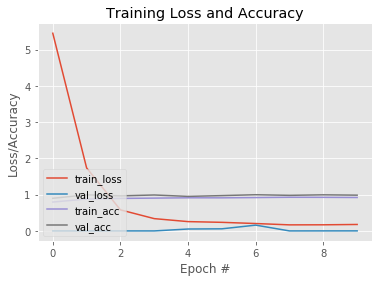

In [168]:
print("[INFO] evaluating after fine-tuning network head...")
testGen.reset()
predIdxs = model.predict_generator(testGen,
	steps=(totalTest // BATCH_SIZE) + 1)
predIdxs = np.argmax(predIdxs, axis=1)
print(classification_report(testGen.classes, predIdxs,
	target_names=testGen.class_indices.keys()))


plot_training(H, trainEpochs, WARMUP_PLOT_PATH)
plt.show()  

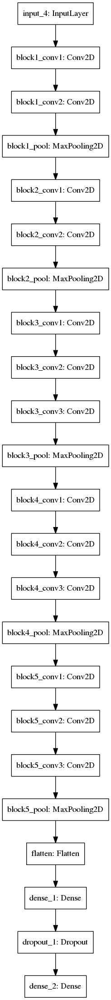

In [169]:
from keras.utils import plot_model
plot_model(model, to_file='model.png')

In [170]:
from sklearn.metrics import roc_curve, auc, confusion_matrix, classification_report
import matplotlib.pyplot as plt
import numpy as np
import seaborn as sns 

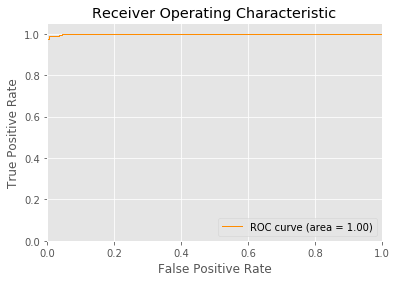

In [171]:
# Assuming testGen and model are defined
testGen.reset()
y_pred_probs = model.predict(testGen, steps=(totalTest // BATCH_SIZE) + 1)
y_true = testGen.classes

# Compute ROC curve for the positive class
fpr, tpr, _ = roc_curve(y_true, y_pred_probs[:, 1])
roc_auc = auc(fpr, tpr)

plt.figure()
plt.plot(fpr, tpr, color='darkorange', lw=1, label='ROC curve (area = %0.2f)' % roc_auc)
plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.05])
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('Receiver Operating Characteristic')
plt.legend(loc="lower right")
plt.show()

In [172]:
testGen.reset()
y_pred_probs = model.predict(testGen, steps=(totalTest // BATCH_SIZE) + 1)


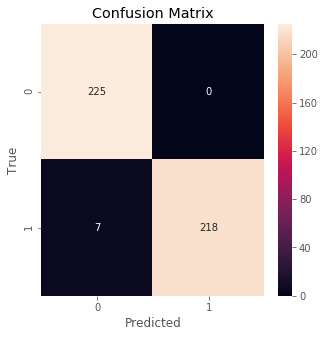

In [173]:
# Compute predicted class labels
y_pred_labels = np.argmax(y_pred_probs, axis=1)

# Compute confusion matrix
cm = confusion_matrix(y_true, y_pred_labels)

# Plot confusion matrix
plt.figure(figsize=(5,5))
sns.heatmap(cm, annot=True, fmt="d")
plt.title('Confusion Matrix')
plt.xlabel('Predicted')
plt.ylabel('True')
plt.show()


Starting to plot...


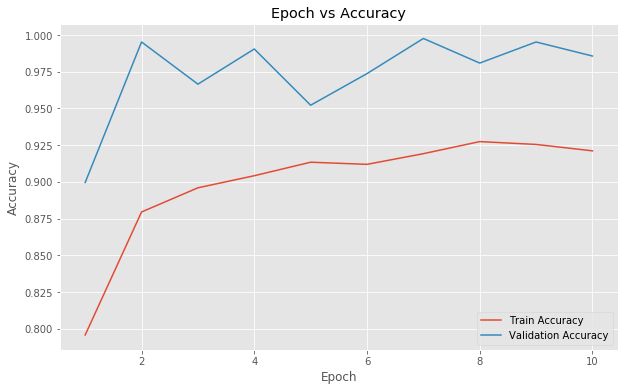

Plot should be displayed above.


In [174]:
def plot_epoch_vs_accuracy(H, save_path=None):
    print("Starting to plot...")  # Debugging print statement
    epochs = len(H.history['accuracy'])  # Automatically determine the number of epochs
    plt.figure(figsize=(10, 6))
    plt.plot(range(1, epochs + 1), H.history['accuracy'], label='Train Accuracy')
    plt.plot(range(1, epochs + 1), H.history['val_accuracy'], label='Validation Accuracy')
    plt.title('Epoch vs Accuracy')
    plt.ylabel('Accuracy')
    plt.xlabel('Epoch')
    plt.legend()
    
    if save_path:
        plt.savefig(save_path)
        
    plt.show()
    print("Plot should be displayed above.")  # Debugging print statement

# Assuming H is defined in your existing code
plot_epoch_vs_accuracy(H)


In [175]:
trainGen.reset()
valGen.reset()

In [176]:
for layer in baseModel.layers[15:]:
	layer.trainable = True

# loop over the layers in the model and show which ones are trainable
# or not
for layer in baseModel.layers:
	print("{}: {}".format(layer, layer.trainable))

# for the changes to the model to take affect we need to recompile
# the model, this time using SGD with a *very* small learning rate
print("[INFO] re-compiling model...")
opt = SGD(lr=1e-4, momentum=0.9)
model.compile(loss="categorical_crossentropy", optimizer=opt,
	metrics=["accuracy"])

<keras.engine.input_layer.InputLayer object at 0x7ce96a34ed68>: False
<keras.layers.convolutional.Conv2D object at 0x7ce5d47e29e8>: False
<keras.layers.convolutional.Conv2D object at 0x7ce5d45e74e0>: False
<keras.layers.pooling.MaxPooling2D object at 0x7ce5f83e32e8>: False
<keras.layers.convolutional.Conv2D object at 0x7ce5f83e3e10>: False
<keras.layers.convolutional.Conv2D object at 0x7ce96a5f14a8>: False
<keras.layers.pooling.MaxPooling2D object at 0x7ce96a24acc0>: False
<keras.layers.convolutional.Conv2D object at 0x7ce9ce19f630>: False
<keras.layers.convolutional.Conv2D object at 0x7ce96a313438>: False
<keras.layers.convolutional.Conv2D object at 0x7ce9d8047240>: False
<keras.layers.pooling.MaxPooling2D object at 0x7ce5e4790160>: False
<keras.layers.convolutional.Conv2D object at 0x7ce96a5d8400>: False
<keras.layers.convolutional.Conv2D object at 0x7cea10d82240>: False
<keras.layers.convolutional.Conv2D object at 0x7ce5e439c160>: False
<keras.layers.pooling.MaxPooling2D object at 0

In [177]:
H = model.fit_generator(
	trainGen,
	steps_per_epoch=totalTrain // BATCH_SIZE,
	validation_data=valGen,
	validation_steps=totalVal // BATCH_SIZE,
	epochs= epochsFineTune)

Epoch 1/10
65/65 [==============================] - 87s 1s/step - loss: 0.1579 - accuracy: 0.9303 - val_loss: 0.0000e+00 - val_accuracy: 1.0000
Epoch 2/10
65/65 [==============================] - 96s 1s/step - loss: 0.1208 - accuracy: 0.9482 - val_loss: 0.0000e+00 - val_accuracy: 1.0000
Epoch 3/10
65/65 [==============================] - 94s 1s/step - loss: 0.0921 - accuracy: 0.9560 - val_loss: 0.0000e+00 - val_accuracy: 0.9785
Epoch 4/10
65/65 [==============================] - 92s 1s/step - loss: 0.0917 - accuracy: 0.9593 - val_loss: 0.0000e+00 - val_accuracy: 0.9976
Epoch 5/10
65/65 [==============================] - 90s 1s/step - loss: 0.0707 - accuracy: 0.9714 - val_loss: 4.7646e-04 - val_accuracy: 1.0000
Epoch 6/10
65/65 [==============================] - 87s 1s/step - loss: 0.0866 - accuracy: 0.9671 - val_loss: 0.0133 - val_accuracy: 1.0000
Epoch 7/10
65/65 [==============================] - 86s 1s/step - loss: 0.0480 - accuracy: 0.9768 - val_loss: 1.3699e-04 - val_accuracy: 1.0

[INFO] evaluating after fine-tuning network...
              precision    recall  f1-score   support

        FAKE       1.00      1.00      1.00       225
        REAL       1.00      1.00      1.00       225

    accuracy                           1.00       450
   macro avg       1.00      1.00      1.00       450
weighted avg       1.00      1.00      1.00       450

[INFO] serializing network...


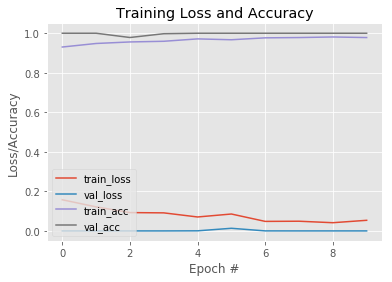

In [178]:
print("[INFO] evaluating after fine-tuning network...")
testGen.reset()
predIdxs = model.predict_generator(testGen,
	steps=(totalTest // BATCH_SIZE) + 1)
predIdxs = np.argmax(predIdxs, axis=1)
print(classification_report(testGen.classes, predIdxs,
	target_names=testGen.class_indices.keys()))
plot_training(H, epochsFineTune, UNFROZEN_PLOT_PATH)

# serialize the model to disk
print("[INFO] serializing network...")
model.save(MODEL_PATH)

Starting to plot...


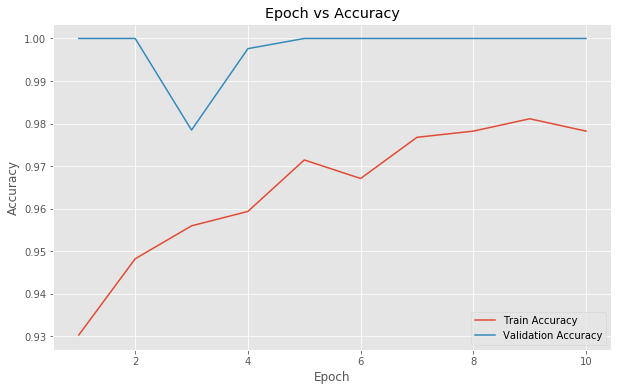

Plot should be displayed above.


In [179]:
def plot_epoch_vs_accuracy(H, save_path=None):
    print("Starting to plot...")  # Debugging print statement
    epochs = len(H.history['accuracy'])  # Automatically determine the number of epochs
    plt.figure(figsize=(10, 6))
    plt.plot(range(1, epochs + 1), H.history['accuracy'], label='Train Accuracy')
    plt.plot(range(1, epochs + 1), H.history['val_accuracy'], label='Validation Accuracy')
    plt.title('Epoch vs Accuracy')
    plt.ylabel('Accuracy')
    plt.xlabel('Epoch')
    plt.legend()
    
    if save_path:
        plt.savefig(save_path)
        
    plt.show()
    print("Plot should be displayed above.")  # Debugging print statement

# Assuming H is defined in your existing code
plot_epoch_vs_accuracy(H)


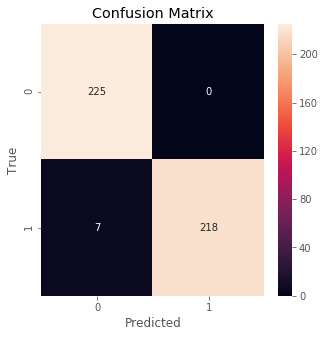

In [180]:
# Compute predicted class labels
y_pred_labels = np.argmax(y_pred_probs, axis=1)

# Compute confusion matrix
cm = confusion_matrix(y_true, y_pred_labels)

# Plot confusion matrix
plt.figure(figsize=(5,5))
sns.heatmap(cm, annot=True, fmt="d")
plt.title('Confusion Matrix')
plt.xlabel('Predicted')
plt.ylabel('True')
plt.show()


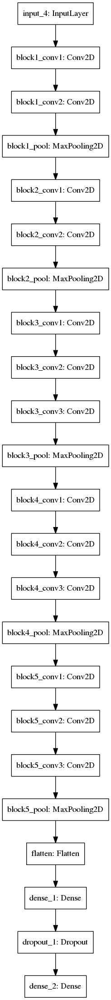

In [181]:
from keras.utils import plot_model
plot_model(model, to_file='model.png')

In [182]:
import wave
import numpy as np
import matplotlib.pyplot as plt

In [183]:
margot_robbie_speech = wave.open('/kaggle/input/deep-voice-deepfake-voice-recognition/KAGGLE/AUDIO/REAL/margot-original.wav', 'rb')
print(margot_robbie_speech)

sample_freq = margot_robbie_speech.getframerate()
n_samples = margot_robbie_speech.getnframes()
t_audio = n_samples/sample_freq
n_channels = margot_robbie_speech.getnchannels()

print("The samping rate of the audio file is " + str(sample_freq) + "Hz, or " + str(sample_freq/1000) + "kHz")
print("The audio contains a total of " + str(n_samples) + " frames or samples")
print("The length of the audio file is " + str(t_audio) + " seconds")
print("The audio file has " + str(n_channels) + " channels.\n")



signal_wave = margot_robbie_speech.readframes(n_samples)
signal_array = np.frombuffer(signal_wave, dtype=np.int16)
print("The signal contains a total of " + str(signal_array.shape[0]) + " samples.")
print("If this value is greater than " + str(n_samples) + " it is due to there being multiple channels")
print("E.g. - Samples * Channels = " + str(n_samples*n_channels))

# Split the channels
l_channel = signal_array[0::2]
r_channel = signal_array[1::2]

The samping rate of the audio file is 44100Hz, or 44.1kHz
The audio contains a total of 3505385 frames or samples
The length of the audio file is 79.48718820861679 seconds
The audio file has 2 channels.

The signal contains a total of 7010770 samples.
If this value is greater than 3505385 it is due to there being multiple channels
E.g. - Samples * Channels = 7010770


In [184]:
import pandas as pd

df = pd.read_csv("/kaggle/input/deep-voice-deepfake-voice-recognition/KAGGLE/DATASET-balanced.csv")

X = df.iloc[:,:-1]
y = df.iloc[:,-1]

print(X.head(10))
print(y.head(10))

   chroma_stft       rms  spectral_centroid  spectral_bandwidth      rolloff  \
0     0.338055  0.027948        2842.948867         4322.916759  6570.586186   
1     0.443766  0.037838        2336.129597         3445.777044  3764.949874   
2     0.302528  0.056578        2692.988386         2861.133180  4716.610271   
3     0.319933  0.031504        2241.665382         3503.766175  3798.641521   
4     0.420055  0.016158        2526.069123         3102.659519  5025.077899   
5     0.442880  0.012317        3952.880304         3702.717829  7104.089991   
6     0.453897  0.021782        4178.072150         3698.644769  7508.242075   
7     0.474154  0.011107        3993.039753         3948.154333  7872.563956   
8     0.602690  0.000970        3815.431438         3992.517515  6887.564689   
9     0.453962  0.017612        2894.560788         3435.434131  5663.232422   

   zero_crossing_rate       mfcc1       mfcc2      mfcc3      mfcc4  ...  \
0            0.041050 -462.169586   90.3112

In [185]:
from sklearn import preprocessing
lb = preprocessing.LabelBinarizer()
lb.fit(y)
y = lb.transform(y)
y = y.ravel()
print(y)

[0 0 0 ... 1 1 1]


In [186]:
from sklearn.ensemble import RandomForestClassifier
model = RandomForestClassifier(n_estimators=80, random_state=1)

from sklearn.model_selection import KFold
kf = KFold(n_splits=10,  shuffle=True, random_state=1)

print(model)
print("KFold splits: " + str(kf.get_n_splits(X)))

RandomForestClassifier(bootstrap=True, class_weight=None, criterion='gini',
                       max_depth=None, max_features='auto', max_leaf_nodes=None,
                       min_impurity_decrease=0.0, min_impurity_split=None,
                       min_samples_leaf=1, min_samples_split=2,
                       min_weight_fraction_leaf=0.0, n_estimators=80,
                       n_jobs=None, oob_score=False, random_state=1, verbose=0,
                       warm_start=False)
KFold splits: 10


In [187]:
import time

import numpy as np

from sklearn.metrics import accuracy_score, precision_score, recall_score, f1_score, matthews_corrcoef, roc_auc_score

acc_score = []
prec_score = []
rec_score = []
f1s = []
MCCs = []
ROCareas = []

start = time.time()
for train_index , test_index in kf.split(X):
    X_train , X_test = X.iloc[train_index,:],X.iloc[test_index,:]
    y_train , y_test = y[train_index] , y[test_index]
     
    model.fit(X_train,y_train)
    pred_values = model.predict(X_test)
    acc = accuracy_score(pred_values , y_test)
    acc_score.append(acc)
    
    prec = precision_score(y_test , pred_values, average="binary", pos_label=1)
    prec_score.append(prec)
    
    rec = recall_score(y_test , pred_values, average="binary", pos_label=1)
    rec_score.append(rec)
    
    f1 = f1_score(y_test , pred_values, average="binary", pos_label=1)
    f1s.append(f1)
    
    mcc = matthews_corrcoef(y_test , pred_values)
    MCCs.append(mcc)   
    
    roc = roc_auc_score(y_test , pred_values)
    ROCareas.append(roc)
end = time.time()
timeTaken = (end - start)
print("Model trained in: " + str( round(timeTaken, 2) ) + " seconds.")

Model trained in: 38.13 seconds.


In [188]:
print("Mean results and (std.):\n")
print("Accuracy: " + str( round(np.mean(acc_score)*100, 3) ) + "% (" + str( round(np.std(acc_score)*100, 3) ) + ")\n")
print("Precision: " + str( round(np.mean(prec_score), 3) ) + " (" + str( round(np.std(prec_score), 3) ) + ")")
print("Recall: " + str( round(np.mean(rec_score), 3) ) + " (" + str( round(np.std(rec_score), 3) ) + ")")
print("F1-Score: " + str( round(np.mean(f1s), 3) ) + " (" + str( round(np.std(f1s), 3) ) + ")")
print("MCC: " + str( round(np.mean(MCCs), 3) ) + " (" + str( round(np.std(MCCs), 3) ) + ")")
print("ROC AUC: " + str( round(np.mean(ROCareas), 3) ) + " (" + str( round(np.std(ROCareas), 3) ) + ")")

Mean results and (std.):

Accuracy: 98.837% (0.374)

Precision: 0.995 (0.006)
Recall: 0.982 (0.006)
F1-Score: 0.988 (0.004)
MCC: 0.977 (0.007)
ROC AUC: 0.988 (0.004)


   chroma_stft       rms  spectral_centroid  spectral_bandwidth      rolloff  \
0     0.338055  0.027948        2842.948867         4322.916759  6570.586186   
1     0.443766  0.037838        2336.129597         3445.777044  3764.949874   
2     0.302528  0.056578        2692.988386         2861.133180  4716.610271   
3     0.319933  0.031504        2241.665382         3503.766175  3798.641521   
4     0.420055  0.016158        2526.069123         3102.659519  5025.077899   

   zero_crossing_rate       mfcc1       mfcc2      mfcc3      mfcc4  ...  \
0            0.041050 -462.169586   90.311272  19.073769  24.046888  ...   
1            0.047730 -409.413422  120.348808  -7.161531   5.114784  ...   
2            0.080342 -318.996033  120.490273 -24.625771  23.891073  ...   
3            0.047180 -404.636749  136.320908   2.308172  -3.907071  ...   
4            0.051905 -410.497925  152.731400 -18.266771  51.993462  ...   

     mfcc12    mfcc13    mfcc14    mfcc15    mfcc16    mfcc17 

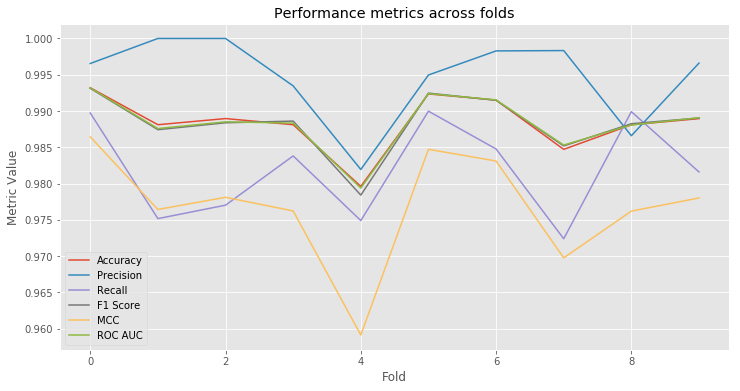

In [189]:
import pandas as pd
import numpy as np
import time
import matplotlib.pyplot as plt

from sklearn import preprocessing
from sklearn.model_selection import KFold, GridSearchCV
from sklearn.ensemble import RandomForestClassifier
from sklearn.metrics import accuracy_score, precision_score, recall_score, f1_score, matthews_corrcoef, roc_auc_score

# Load dataset
df = pd.read_csv("/kaggle/input/deep-voice-deepfake-voice-recognition/KAGGLE/DATASET-balanced.csv")

# Data Exploration
print(df.head())
print(df.describe())
print(df.info())

# Splitting the dataset into features and target
X = df.iloc[:,:-1]
y = df.iloc[:,-1]

# Label Binarization
lb = preprocessing.LabelBinarizer()
lb.fit(y)
y = lb.transform(y)
y = y.ravel()

# Feature scaling (Optional)
# from sklearn.preprocessing import StandardScaler
# scaler = StandardScaler()
# X = scaler.fit_transform(X)

# Initialize model and KFold
model = RandomForestClassifier(n_estimators=80, random_state=1)
kf = KFold(n_splits=10,  shuffle=True, random_state=1)

# Metrics to keep track
acc_score = []
prec_score = []
rec_score = []
f1s = []
MCCs = []
ROCareas = []

# Model training and evaluation
start = time.time()
for train_index, test_index in kf.split(X):
    X_train, X_test = X.iloc[train_index,:], X.iloc[test_index,:]
    y_train, y_test = y[train_index], y[test_index]
    
    model.fit(X_train, y_train)
    pred_values = model.predict(X_test)
    
    acc_score.append(accuracy_score(y_test, pred_values))
    prec_score.append(precision_score(y_test, pred_values))
    rec_score.append(recall_score(y_test, pred_values))
    f1s.append(f1_score(y_test, pred_values))
    MCCs.append(matthews_corrcoef(y_test, pred_values))
    ROCareas.append(roc_auc_score(y_test, pred_values))

end = time.time()

# Display Results
print(f"Model trained in {round(end - start, 2)} seconds.")
print("Mean results and (std.):\n")
print(f"Accuracy: {round(np.mean(acc_score)*100, 3)}% ({round(np.std(acc_score)*100, 3)})")
print(f"Precision: {round(np.mean(prec_score), 3)} ({round(np.std(prec_score), 3)})")
print(f"Recall: {round(np.mean(rec_score), 3)} ({round(np.std(rec_score), 3)})")
print(f"F1-Score: {round(np.mean(f1s), 3)} ({round(np.std(f1s), 3)})")
print(f"MCC: {round(np.mean(MCCs), 3)} ({round(np.std(MCCs), 3)})")
print(f"ROC AUC: {round(np.mean(ROCareas), 3)} ({round(np.std(ROCareas), 3)})")

# Performance Visualization
plt.figure(figsize=(12, 6))
plt.plot(acc_score, label='Accuracy')
plt.plot(prec_score, label='Precision')
plt.plot(rec_score, label='Recall')
plt.plot(f1s, label='F1 Score')
plt.plot(MCCs, label='MCC')
plt.plot(ROCareas, label='ROC AUC')
plt.title('Performance metrics across folds')
plt.xlabel('Fold')
plt.ylabel('Metric Value')
plt.legend()
plt.show()
